In [26]:
%system free -m

['              total        used        free      shared  buff/cache   available',
 'Mem:         126104       73128       41349           4       11626       51891',
 'Swap:             0           0           0']

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import flowkit as fk

In [20]:
for var in ['bld_flow', 'bom_flow', 'jel_flow', 'jlp_flow', 'lln_flow', 'lng_flow', 'mln_flow', 'spl_flow']:
    del globals()[var]

In [25]:
for var in ['df_flow', 'df_flow_counts']:
    del globals()[var]

In [35]:
for var in ['adata']:
    del globals()[var]

In [3]:
bld_dir = 'BLD_CD45AF_CD3'
session_bld= fk.Session(fcs_samples=bld_dir)
bld_samples = session_bld.get_sample_ids()

In [4]:
bom_dir = "BOM_T7_export CD3_11DEC24"
session_bom = fk.Session(fcs_samples=bom_dir)
bom_samples = session_bom.get_sample_ids()

In [ ]:
jel_dir = 'JEL_T7 exported CD45AF'
session_jel = fk.Session(fcs_samples=jel_dir)
jel_samples = session_jel.get_sample_ids()

In [ ]:
jlp_dir = 'JLP_T7_exported CD3_10DEC24'
session_jlp = fk.Session(fcs_samples=jlp_dir)
jlp_samples = session_jlp.get_sample_ids()

In [ ]:
lln_dir = 'LLN_T7_exported CD45AF'
session_lln = fk.Session(fcs_samples=lln_dir)
lln_samples = session_lln.get_sample_ids()

In [ ]:
lng_dir = "LNG_T7_export CD3_12DEC24"
session_lng = fk.Session(fcs_samples=lng_dir)
lng_samples = session_lng.get_sample_ids()

In [ ]:
mln_dir = "MLN_T7_export CD3_12DEC24"
session_mln = fk.Session(fcs_samples=mln_dir)
mln_samples = session_mln.get_sample_ids()

In [ ]:
spl_dir = 'SPL_T7_export CD3_12DEC24'
session_spl = fk.Session(fcs_samples=spl_dir)
spl_samples = session_spl.get_sample_ids()

In [11]:
bld_flow = []
for sample_id in bld_samples:
    df = session_bld.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] = 'bld'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    bld_flow.append(df)

bld_flow = pd.concat(bld_flow)
bld_flow.columns = [pns if pns != '' else pnn for pnn, pns in bld_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45']
bld_flow = bld_flow.drop(columns=exclude)

In [12]:
bom_flow = []
for sample_id in bom_samples:
    df = session_bom.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] = 'bom'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    bom_flow.append(df)

bom_flow = pd.concat(bom_flow)
bom_flow.columns = [pns if pns != '' else pnn for pnn, pns in bom_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45']
bom_flow = bom_flow.drop(columns=exclude)

In [ ]:
jel_flow = []
for sample_id in jel_samples:
    df = session_jel.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] = 'jel'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    jel_flow.append(df)
    
jel_flow = pd.concat(jel_flow)
jel_flow.columns = [pns if pns!= '' else pnn for pnn, pns in jel_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45', 'SampleID']
jel_flow = jel_flow.drop(columns=exclude)

In [ ]:
jlp_flow = []
for sample_id in jlp_samples:
    df = session_jlp.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] = 'jlp'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    jlp_flow.append(df)
    
jlp_flow = pd.concat(jlp_flow)
jlp_flow.columns = [pns if pns!= '' else pnn for pnn, pns in jlp_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45', 'SampleID']
jlp_flow = jlp_flow.drop(columns=exclude)

In [ ]:
lln_flow = []
for sample_id in lln_samples:
    df = session_lln.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] = 'lln'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    lln_flow.append(df)

lln_flow = pd.concat(lln_flow)
lln_flow.columns = [pns if pns!= '' else pnn for pnn, pns in lln_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45']
lln_flow = lln_flow.drop(columns=exclude)

In [ ]:
lng_flow = []
for sample_id in lng_samples:
    df = session_lng.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] = 'lng'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    lng_flow.append(df)
    
lng_flow = pd.concat(lng_flow)
lng_flow.columns = [pns if pns!= '' else pnn for pnn, pns in lng_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45']
lng_flow = lng_flow.drop(columns=exclude)

In [ ]:
mln_flow = []
for sample_id in mln_samples:
    df = session_mln.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] ='mln'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    mln_flow.append(df)

mln_flow = pd.concat(mln_flow)
mln_flow.columns = [pns if pns!= '' else pnn for pnn, pns in mln_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45']
mln_flow = mln_flow.drop(columns=exclude)

In [ ]:
spl_flow = []
for sample_id in spl_samples:
    df = session_spl.get_gate_events(sample_id)
    df["sample_id"] = sample_id
    df['tissue'] ='spl'
    if "ctr" in sample_id:
        df["condition"] = "ctr"
    elif "hst" in sample_id:
        df["condition"] = "hst"
    elif "ftl" in sample_id:
        df["condition"] = "ftl"
    spl_flow.append(df)

spl_flow = pd.concat(spl_flow)
spl_flow.columns = [pns if pns!= '' else pnn for pnn, pns in spl_flow.columns]
exclude = ['FSC-A', 'FSC-H', 'SSC-A', 'SSC-H', 'Time', 'SSC-B-A', "SSC-B-H", "AF-A", 'CD66bCD19CD326LD', 'CD45', 'Event #']
spl_flow = spl_flow.drop(columns=exclude)

In [ ]:
df_flow = pd.concat([bld_flow, bom_flow, jel_flow, jlp_flow, lln_flow, lng_flow, mln_flow, spl_flow])

In [22]:
df_flow_counts = df_flow.select_dtypes(include=[np.number])

In [23]:
df_flow['sample_id'] = df_flow['sample_id'].apply(lambda x: x[:4])
list_metadata = {'group' : df_flow.condition, 'sample_id' : df_flow.sample_id, 'tissue': df_flow.tissue}
df_metadata = pd.DataFrame(list_metadata)

In [24]:
adata = sc.AnnData(df_flow_counts)
df_metadata.index = adata.obs.index
adata.obs['group'] = df_metadata.group
adata.obs['sample_id'] = df_metadata.sample_id
adata.obs['tissue'] = df_metadata.tissue

/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
sc.pp.scale(adata, max_value=5)

In [ ]:
CD3 = adata[(adata[:, 'CD3'].X > 0)]
CD3 = CD3[:, CD3.var.index != 'CD3']
adata_list = [
    CD3[CD3.obs['group'] == group].copy()[np.random.choice(
        CD3[CD3.obs['group'] == group].shape[0], 20000, replace=False
    )]
    for group in ['ctr', 'hst', 'ftl']
]

for i, group in enumerate(['ctr', 'hst', 'ftl']):
    adata_list[i].obs['group'] = group

CD3 = sc.AnnData.concatenate(*adata_list, index_unique=None)

In [ ]:
adata = adata[:, adata.var.index != 'CD3']
adata

In [80]:
gdTCR = adata[(adata[:, 'gdTCR'].X > 0)]
gdTCR = gdTCR[:, gdTCR.var.index != 'gdTCR']
gdTCR = gdTCR[:, gdTCR.var.index != 'TCRva']

# Define groups and tissues
groups = ['ctr', 'hst', 'ftl']
tissues = ['bld', 'bom', 'jel', 'jlp', 'lln', 'lng', 'mln', 'spl']

# Create a list of AnnData objects with 2500 cells for each (group, tissue) combination
adata_list = []

for group in groups:
    for tissue in tissues:
        subset = gdTCR[(gdTCR.obs['group'] == group) & (gdTCR.obs['tissue'] == tissue)]
        if subset.shape[0] >= 2500:
            sampled_subset = subset[np.random.choice(subset.shape[0], 2500, replace=False)]
        else:
            sampled_subset = subset  # If fewer than 2500 cells are available, take all
        
        sampled_subset.obs['group'] = f"{group}"
        adata_list.append(sampled_subset.copy())

# Concatenate all sampled data into one AnnData object
gdTCR = sc.AnnData.concatenate(*adata_list, index_unique=None)

/tmp/ipykernel_2215/562140734.py:20: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sampled_subset.obs['group'] = f"{group}"
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/tmp/ipykernel_2215/562140734.py:24: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  gdTCR = sc.AnnData.concatenate(*adata_list, index_unique=None)
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_

In [62]:
TCRva = adata[(adata[:, 'TCRva'].X > 0)]
TCRva = TCRva[:, TCRva.var.index != 'gdTCR']
TCRva = TCRva[:, TCRva.var.index != 'TCRva']

groups = ['ctr', 'hst', 'ftl']
tissues = ['bld', 'bom', 'jel', 'jlp', 'lln', 'lng', 'mln', 'spl']

adata_list = []

for group in groups:
    for tissue in tissues:
        subset = TCRva[(TCRva.obs['group'] == group) & (TCRva.obs['tissue'] == tissue)]
        if subset.shape[0] >= 2500:
            sampled_subset = subset[np.random.choice(subset.shape[0], 2500, replace=False)]
        else:
            sampled_subset = subset  # If fewer than 2500 cells are available, take all
        
        sampled_subset.obs['group'] = f"{group}"
        adata_list.append(sampled_subset.copy())

# Concatenate all sampled data into one AnnData object
TCRva = sc.AnnData.concatenate(*adata_list, index_unique=None)

/tmp/ipykernel_2215/1212738507.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sampled_subset.obs['group'] = f"{group}"
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/tmp/ipykernel_2215/1212738507.py:22: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  TCRva = sc.AnnData.concatenate(*adata_list, index_unique=None)
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/ubuntu/.local/lib/python3.11/site-packages/anndata

In [28]:
CD4 = adata[(adata[:, 'CD4'].X > 0)]
CD4 = CD4[:, CD4.var.index != 'gdTCR']
CD4 = CD4[:, CD4.var.index != 'TCRva']
CD4 = CD4[:, CD4.var.index != 'CD4']
CD4 = CD4[:, CD4.var.index != 'CD8']

groups = ['ctr', 'hst', 'ftl']
tissues = ['bld', 'bom', 'jel', 'jlp', 'lln', 'lng', 'mln', 'spl']

adata_list = []

for group in groups:
    for tissue in tissues:
        subset = CD4[(CD4.obs['group'] == group) & (CD4.obs['tissue'] == tissue)]
        if subset.shape[0] >= 2500:
            sampled_subset = subset[np.random.choice(subset.shape[0], 2500, replace=False)]
        else:
            sampled_subset = subset  # If fewer than 2500 cells are available, take all
        
        sampled_subset.obs['group'] = f"{group}"
        adata_list.append(sampled_subset.copy())

# Concatenate all sampled data into one AnnData object
CD4 = sc.AnnData.concatenate(*adata_list, index_unique=None)

/tmp/ipykernel_1978/2722567152.py:20: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sampled_subset.obs['group'] = f"{group}"
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/tmp/ipykernel_1978/2722567152.py:24: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  CD4 = sc.AnnData.concatenate(*adata_list, index_unique=None)
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_

In [29]:
CD8 = adata[(adata[:, 'CD8'].X > 0)]
CD8 = CD8[:, CD8.var.index != 'gdTCR']
CD8 = CD8[:, CD8.var.index != 'TCRva']
CD8 = CD8[:, CD8.var.index != 'CD4']
CD8 = CD8[:, CD8.var.index != 'CD8']

groups = ['ctr', 'hst', 'ftl']
tissues = ['bld', 'bom', 'jel', 'jlp', 'lln', 'lng', 'mln', 'spl']

adata_list = []

for group in groups:
    for tissue in tissues:
        subset = CD8[(CD8.obs['group'] == group) & (CD8.obs['tissue'] == tissue)]
        if subset.shape[0] >= 2500:
            sampled_subset = subset[np.random.choice(subset.shape[0], 2500, replace=False)]
        else:
            sampled_subset = subset  # If fewer than 2500 cells are available, take all
        
        sampled_subset.obs['group'] = f"{group}"
        adata_list.append(sampled_subset.copy())

# Concatenate all sampled data into one AnnData object
CD8 = sc.AnnData.concatenate(*adata_list, index_unique=None)

/tmp/ipykernel_1978/3110379991.py:20: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sampled_subset.obs['group'] = f"{group}"
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/tmp/ipykernel_1978/3110379991.py:24: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  CD8 = sc.AnnData.concatenate(*adata_list, index_unique=None)
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/ubuntu/.local/lib/python3.11/site-packages/anndata/_

In [56]:
sample = CD8
sample_name = 'CD8'
tissue_type = 'All'

In [57]:
sc.settings.verbosity = 3

computing PCA
    with n_comps=18
    finished (0:00:00)


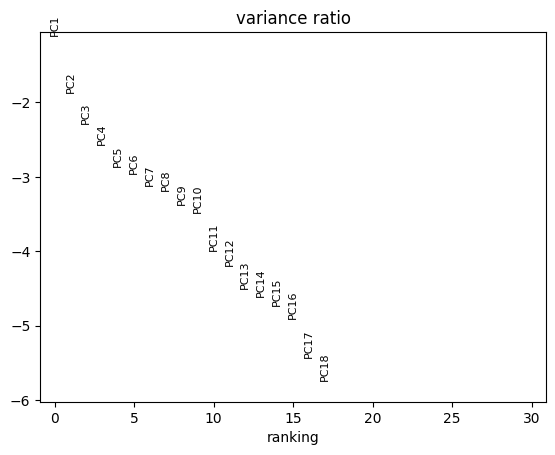

In [58]:
sc.tl.pca(sample, svd_solver="arpack")
sc.pl.pca_variance_ratio(sample, log=True)

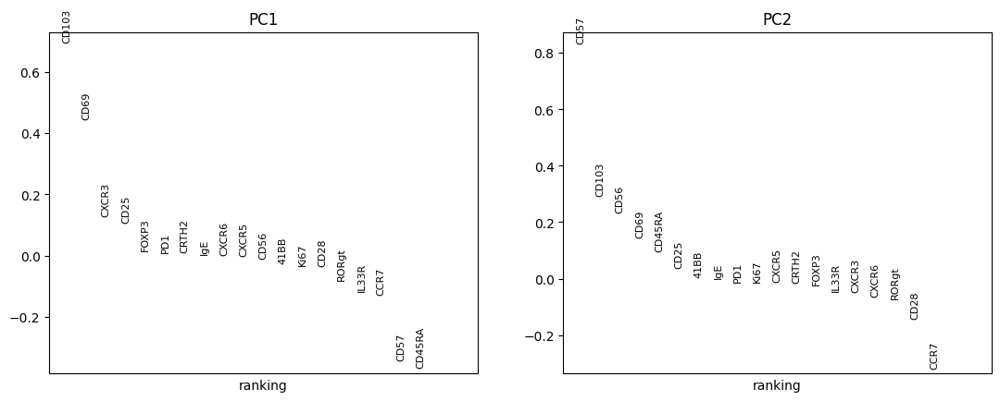

In [59]:
sc.pl.pca_loadings(sample, components = '1,2')

In [60]:
bld_samples = session_bld.get_sample_ids()
bom_samples = session_bom.get_sample_ids()
jel_samples = session_jel.get_sample_ids()
jlp_samples = session_jlp.get_sample_ids()
lln_samples = session_lln.get_sample_ids()
lng_samples = session_lng.get_sample_ids()
mln_samples = session_mln.get_sample_ids()
spl_samples = session_spl.get_sample_ids()

In [61]:
sample_list = bld_samples + bom_samples + jel_samples + jlp_samples + lln_samples + lng_samples + mln_samples + spl_samples
sample_list = list(set(sample_list))

In [62]:
#make a list of sample_ids from sample list where the string name is the sample_name[:4]. if the full sample_name contains "ctr", assign 'ctr' to the sample id. if it contains 'hst', assign 'hst' to the sample id. if it contains 'ftl', assign 'ftl' to the sample id
sample_df = pd.DataFrame(index=sample_list)
sample_df['condition'] = ['ctr' if 'ctr' in sample else 'hst' if 'hst' in sample else 'ftl' for sample in sample_list]
sample_df['donor'] = [sample[:4] for sample in sample_list]

In [63]:
sample_df = sample_df.drop_duplicates()
sample_df.rename(columns={'donor':'sample_id'}, inplace=True)

In [64]:
import pandas as pd

# Extract PCA embeddings and donor information
pca_df = pd.DataFrame(sample.obsm['X_pca'], columns=[f'PC{i+1}' for i in range(sample.obsm['X_pca'].shape[1])])
pca_df['sample_id'] = sample.obs['sample_id'].values

# Group by sample_id and compute the mean PCA coordinates
grouped_pca = pca_df.groupby('sample_id').mean()
donor_groups = []

In [65]:
grouped_samples = list(grouped_pca.index)

In [66]:
for samplee in grouped_samples:
    match = sample_df[sample_df['sample_id'] == samplee].sample_id.values
    if match.size > 0:
        #append the matching sample's condition
        donor_groups.append(sample_df[sample_df['sample_id'] == samplee].condition.values[0])
    else:
        donor_groups.append('Unknown')

In [67]:
grouped_pca['donor_group'] = donor_groups

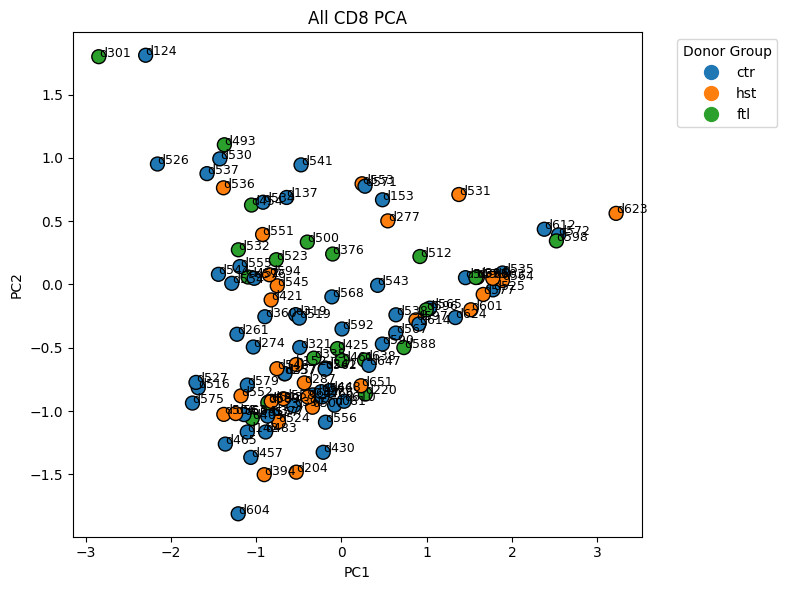

In [ ]:
donor_colors = {
    'ctr': 'grey',
    'hst': 'pink',
    'ftl': 'red'
}

colors = grouped_pca['donor_group'].map(lambda x: donor_colors.get(x, 'black'))

plt.figure(figsize=(8, 6))
plt.scatter(grouped_pca['PC1'], grouped_pca['PC2'], c=colors, edgecolor='k', s=100)

for sample_id, (x, y) in grouped_pca[['PC1', 'PC2']].iterrows():
    plt.text(x, y, sample_id, fontsize=9)

for group, color in donor_colors.items():
    subset = grouped_pca[grouped_pca['donor_group'] == group]
    if not subset.empty:
        centroid_x, centroid_y = subset[['PC1', 'PC2']].mean()
        max_distance = np.max(np.linalg.norm(subset[['PC1', 'PC2']].values - np.array([centroid_x, centroid_y]), axis=1))
        circle = plt.Circle((centroid_x, centroid_y), max_distance, color=color, fill=False, linestyle='--', linewidth=2)
        plt.gca().add_patch(circle)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('{} {} PCA'.format(tissue_type, sample_name))

handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10) 
           for color in donor_colors.values()]
plt.legend(handles, donor_colors.keys(), title='Donor Group', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=0, perplexity = 5)
tsne_results = tsne.fit_transform(grouped_pca.iloc[:, :-1])

grouped_pca['tSNE1'] = tsne_results[:, 0]
grouped_pca['tSNE2'] = tsne_results[:, 1]

donor_colors = {
    'ctr': 'grey',
    'hst': 'pink',
    'ftl': 'red'
}

colors = grouped_pca['donor_group'].map(lambda x: donor_colors.get(x, 'black'))

plt.figure(figsize=(8, 6))
plt.scatter(grouped_pca['tSNE1'], grouped_pca['tSNE2'], c=colors, edgecolor='k', s=100)

for sample_id, (x, y) in grouped_pca[['tSNE1', 'tSNE2']].iterrows():
    plt.text(x, y, sample_id, fontsize=9)

for group, color in donor_colors.items():
    subset = grouped_pca[grouped_pca['donor_group'] == group]
    if not subset.empty:
        centroid_x, centroid_y = subset[['tSNE1', 'tSNE2']].mean()
        max_distance = np.max(np.linalg.norm(subset[['tSNE1', 'tSNE2']].values - np.array([centroid_x, centroid_y]), axis=1))
        circle = plt.Circle((centroid_x, centroid_y), max_distance, color=color, fill=False, linestyle='--', linewidth=2)
        plt.gca().add_patch(circle)

plt.xlabel('tSNE1')
plt.ylabel('tSNE2')
plt.title('{} {} t-SNE'.format(tissue_type, sample_name))

handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10) 
           for color in donor_colors.values()]
plt.legend(handles, donor_colors.keys(), title='Donor Group', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:52)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)
--> added 'pos', the PAGA positions (adata.uns['paga'])


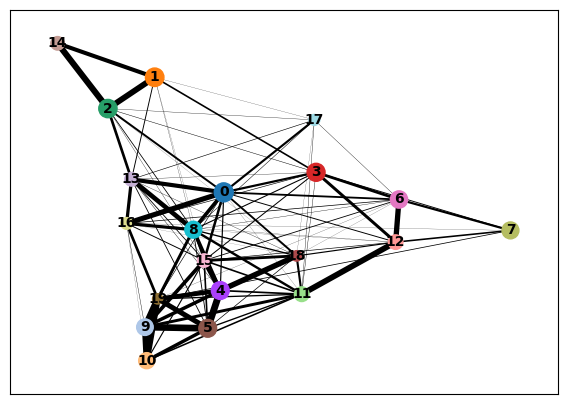

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:21)


In [ ]:
sc.pp.neighbors(sample, n_neighbors=15, n_pcs= 20, random_state=0)
sc.tl.leiden(sample, resolution=0.8, flavor='leidenalg')
sc.tl.paga(sample)
sc.pl.paga(sample)
sc.tl.umap(sample, init_pos='paga', random_state=0)

In [ ]:
markers = list(sample.var_names)

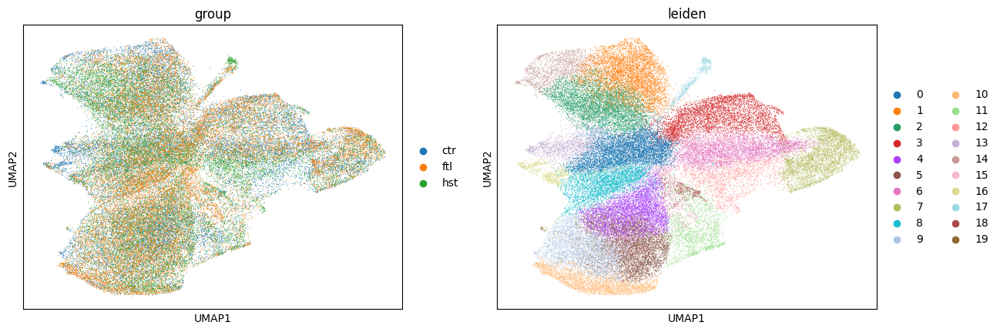

In [ ]:
sc.pl.umap(sample, color= ['group'], cmap='turbo')

In [ ]:
sc.pl.umap(sample, color= ['leiden'], cmap='turbo')

/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1143: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


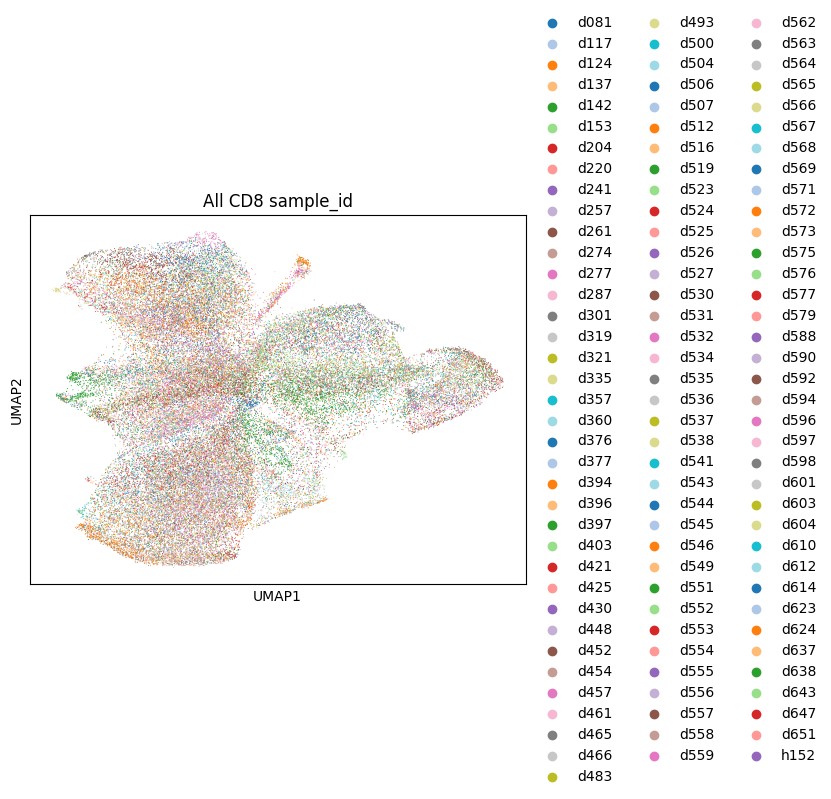

In [71]:
import seaborn as sns
import scanpy as sc

# Get unique categories
unique_samples = sample.obs['sample_id'].unique()

# Generate a color palette with sufficient unique colors
palette = sns.color_palette("tab20", n_colors=len(unique_samples))

# Map sample_id categories to colors
sample.uns['sample_id_colors'] = [palette[i % len(palette)] for i in range(len(unique_samples))]

# Plot with custom colors
sc.pl.umap(sample, color='sample_id', title='{} {} sample_id'.format(tissue_type, sample_name))


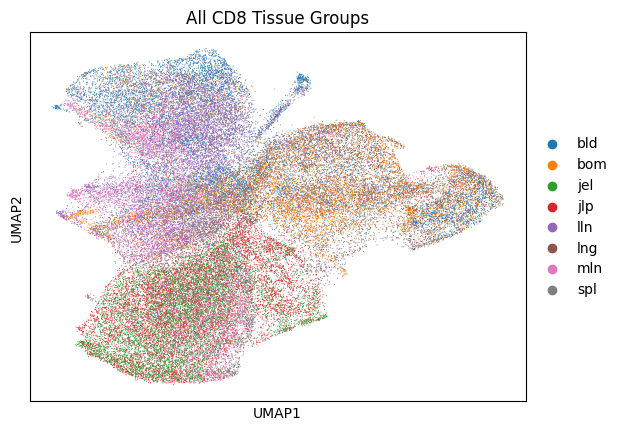

In [72]:
sc.pl.umap(sample, color= ['tissue'], cmap='turbo', title = 'All {} Tissue Groups'.format(sample_name))

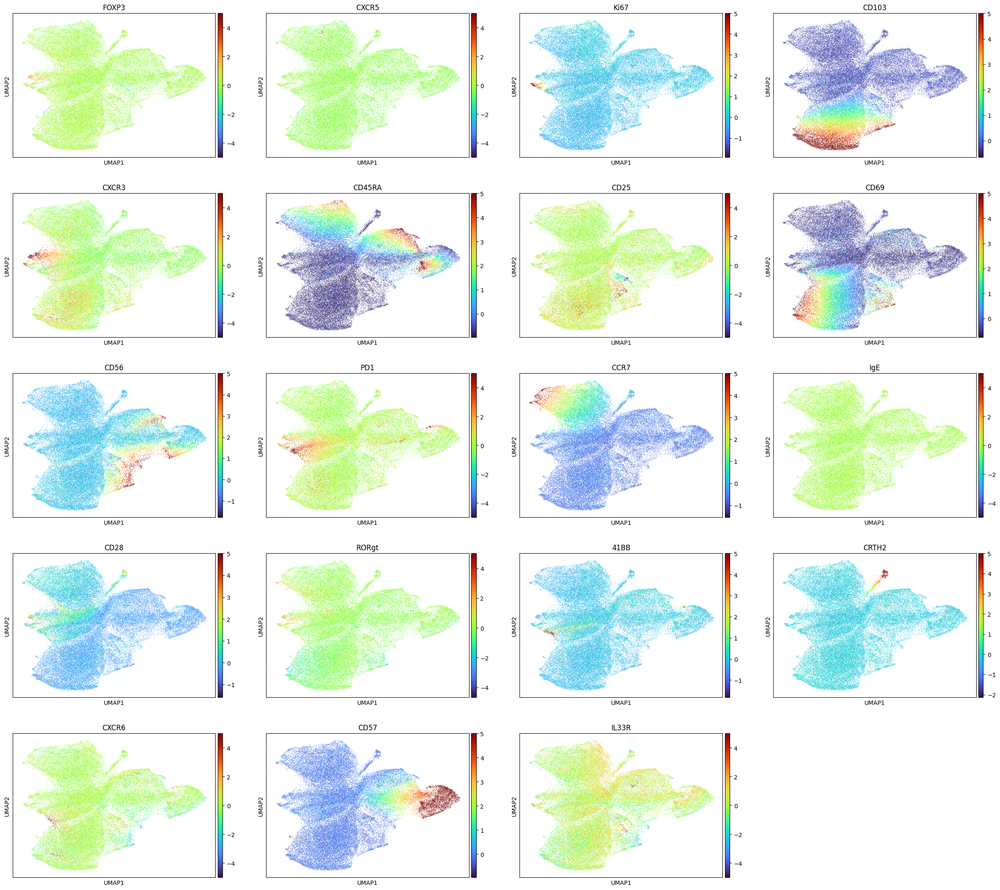

In [ ]:
plt.rcParams.update({'font.size': 14}) 
sc.pl.umap(sample, color= markers, cmap='turbo')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


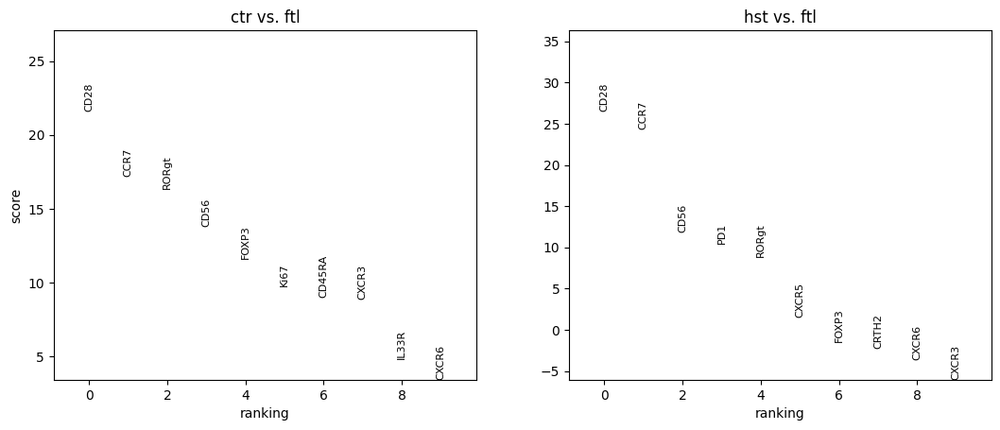

In [74]:
sc.tl.rank_genes_groups(sample, groupby='group', groups = ['ctr','hst'], reference = 'ftl', method='t-test')
sc.pl.rank_genes_groups(sample, n_genes=10, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


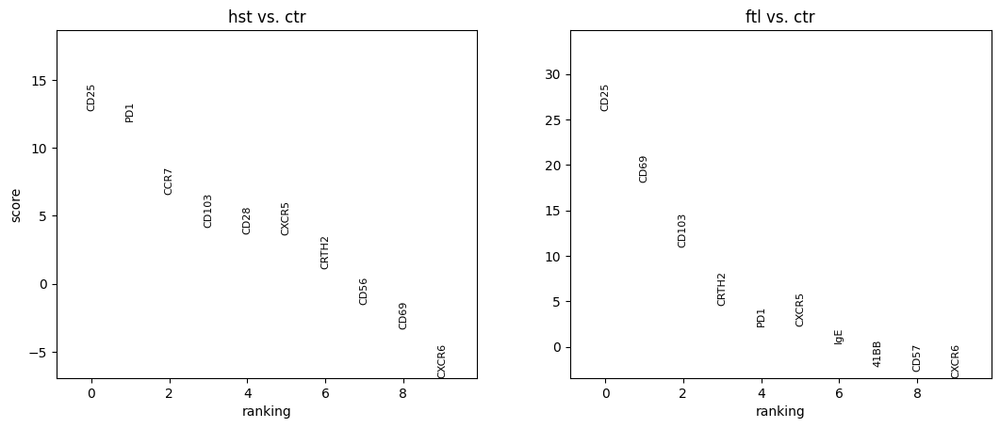

In [75]:
sc.tl.rank_genes_groups(sample, groupby='group', groups = ['hst', 'ftl'], reference = 'ctr', method='t-test')
sc.pl.rank_genes_groups(sample, n_genes=10, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


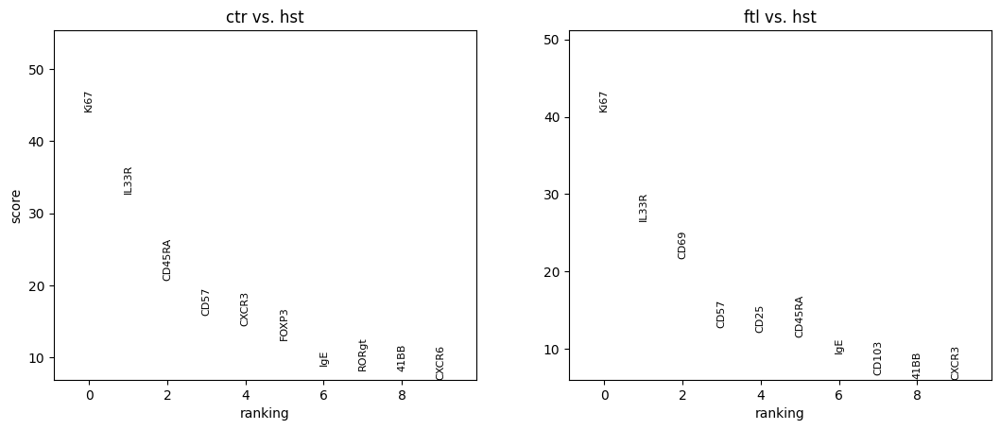

In [76]:
sc.tl.rank_genes_groups(sample, groupby='group', groups = ['ctr', 'ftl'], reference = 'hst', method='t-test')
sc.pl.rank_genes_groups(sample, n_genes=10, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
    using data matrix X directly


/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/ubuntu/.local/lib/python3.11/

Storing dendrogram info using `.uns['dendrogram_leiden']`


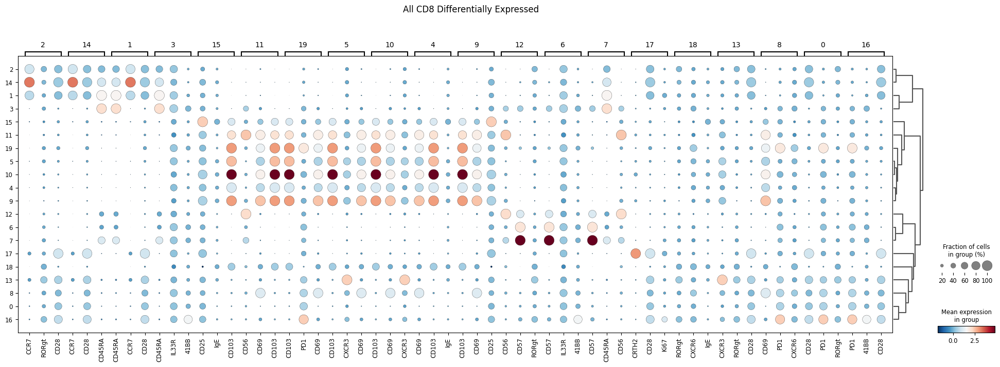

In [ ]:
sc.tl.rank_genes_groups(sample, "leiden", method="wilcoxon")
df = pd.DataFrame(
    {group: sample.uns["rank_genes_groups"]["names"][group] for group in sample.uns["rank_genes_groups"]["names"].dtype.names}
)
df.head(3)

In [ ]:
result = sample.uns["rank_genes_groups"]
groups = result["names"].dtype.names

celltype = {'celltype': []}
cluster_to_genes = {}
for group in groups:
    top_genes = result["names"][group][:3]
    cluster_to_genes[group] = f"{':'.join(top_genes)} ({group})"

celltype['celltype'] = [cluster_to_genes[leiden] for leiden in sample.obs['leiden']]
sample.obs["celltype"] = celltype['celltype']

print(sample.obs[["leiden", "celltype"]].head())

In [ ]:
plt.rcParams.update({'font.size': 10})  

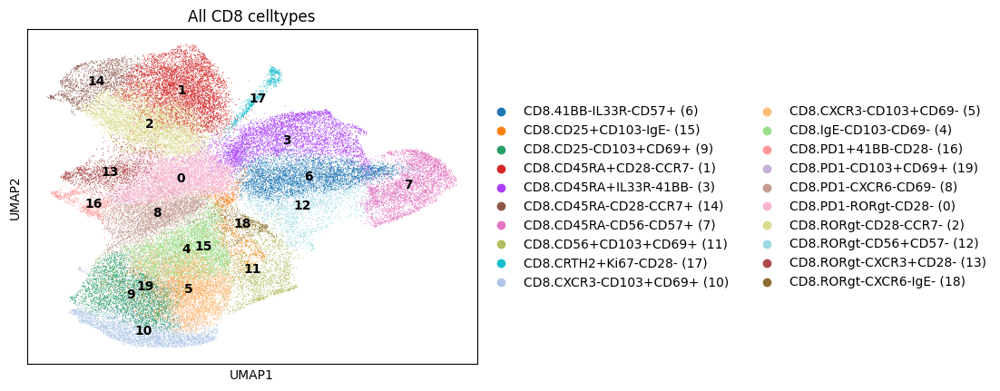

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt

# Plot the UMAP
sc.pl.umap(
    sample,
    color=['celltype'],
    cmap='turbo',
    title = '{} {} celltypes'.format(tissue_type, sample_name),# Show legends directly on the UMAP
    show=False,            # Prevent immediate display
)

# Add cluster labels
ax = plt.gca()  # Get current axis
for cluster in sample.obs['leiden'].cat.categories:
    # Find the coordinates of cells in this cluster
    cluster_mask = sample.obs['leiden'] == cluster
    cluster_coords = sample.obsm['X_umap'][cluster_mask]
    # Calculate cluster centroid
    x, y = cluster_coords[:, 0].mean(), cluster_coords[:, 1].mean()
    # Add text label
    ax.text(x, y, cluster, color='black', fontsize=10, weight='bold', ha='center', va='center')

# Display the plot
plt.show()

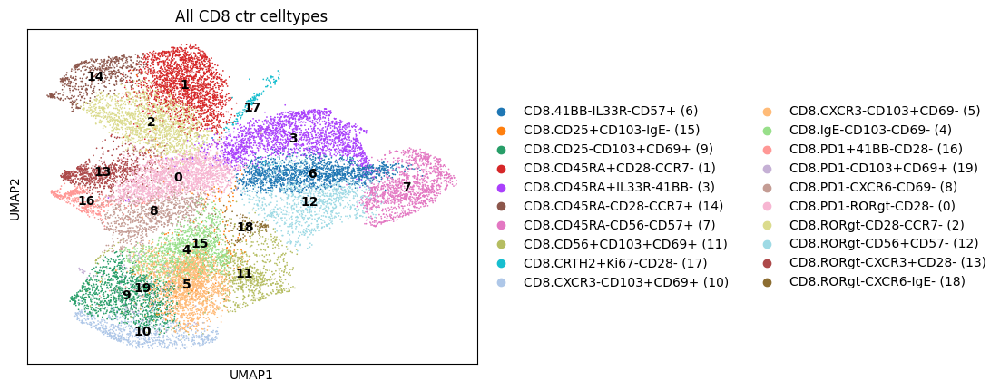

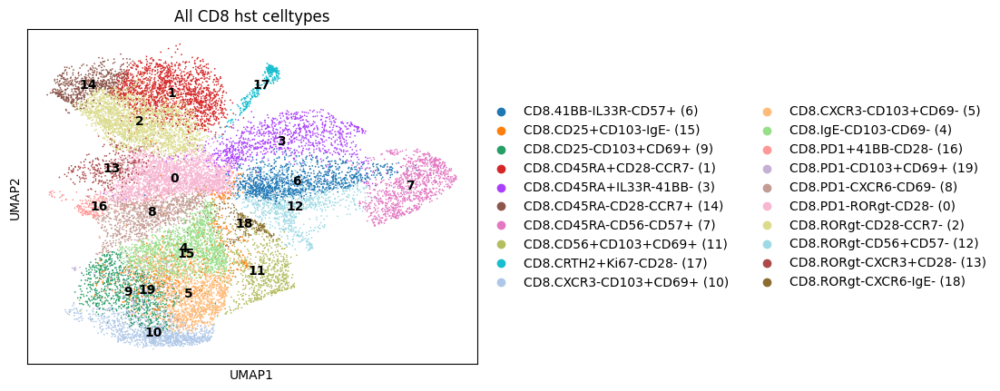

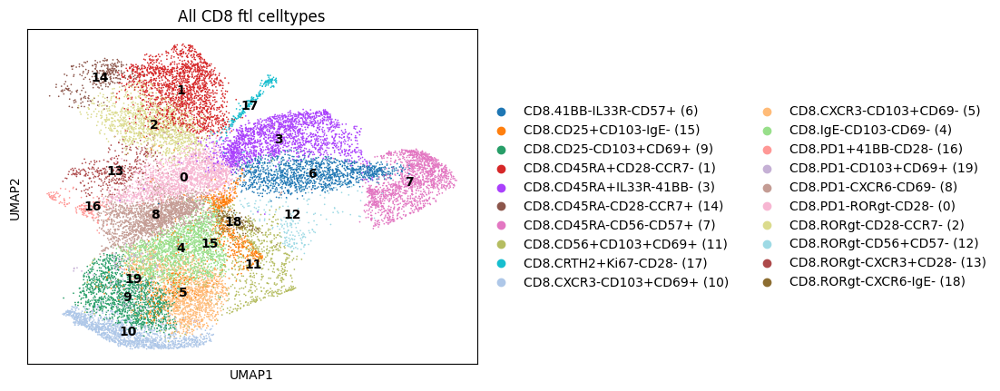

In [ ]:
for group in ['ctr', 'hst', 'ftl']:
    adata_group = sample[sample.obs['group'] == group]
    
    sc.pl.umap(
    adata_group,
    color=['celltype'],
    title=f'{tissue_type} {sample_name} {group} celltypes',
    cmap='turbo', 
    show=False             
)

    ax = plt.gca()  
    for cluster in adata_group.obs['leiden'].cat.categories:
        cluster_mask = adata_group.obs['leiden'] == cluster
        cluster_coords = adata_group.obsm['X_umap'][cluster_mask]
        x, y = cluster_coords[:, 0].mean(), cluster_coords[:, 1].mean()
        ax.text(x, y, cluster, color='black', fontsize=10, weight='bold', ha='center', va='center')

    plt.show()

In [ ]:
plt.rcParams.update({'font.size': 12})  

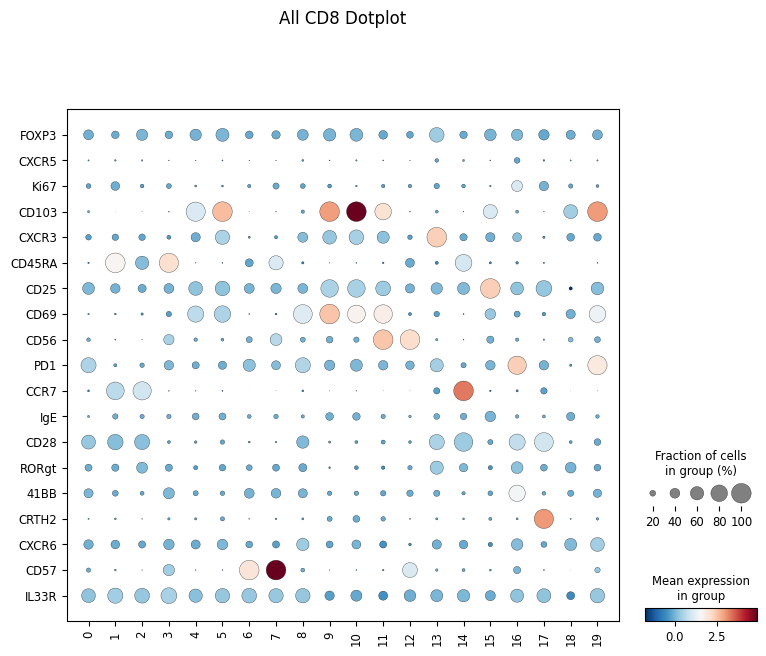

In [ ]:
sc.pl.dotplot(sample, markers, swap_axes=True, groupby='leiden', title = "{} {} Dotplot".format(tissue_type, sample_name), cmap='RdBu_r', vmin = -4, vmax = 4)

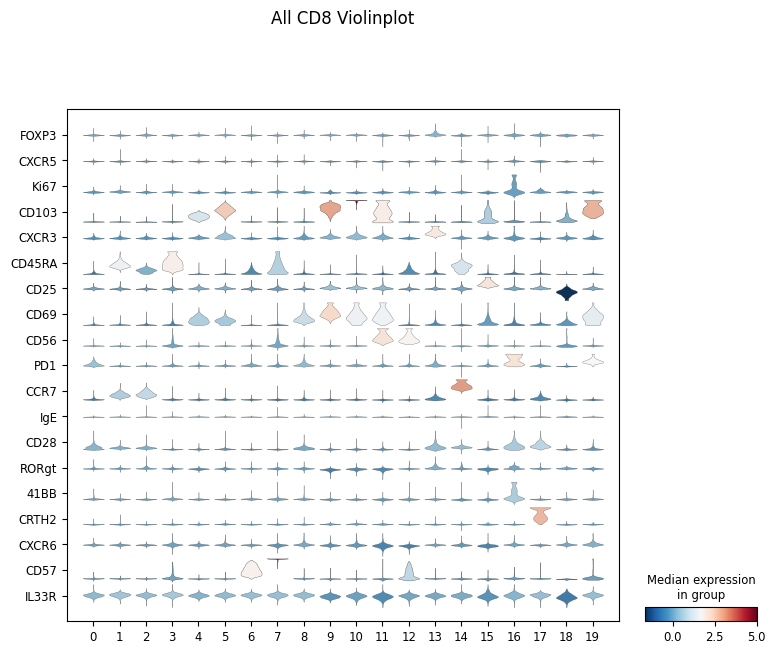

In [ ]:
sc.pl.stacked_violin(sample, markers, swap_axes=True, groupby='leiden', title = "{} {} Violinplot".format(tissue_type, sample_name), cmap='RdBu_r', vmin = -4, vmax = 4)